# Isaac Rodríguez Bribiesca
## Tarea 5

Se importan bibliotecas

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [2]:
from keras.layers import Input, Dense, Activation, Conv2D, Add
from keras.layers import MaxPooling2D, Dropout, UpSampling2D, ReLU
from keras.layers import BatchNormalization, Reshape
from keras.layers.merge import Concatenate
from keras.models import Model
from keras.models import Sequential
from keras.utils import plot_model
from keras import models
from keras import optimizers
from keras.layers import Lambda, Input
from datetime import datetime
from tensorboardcolab import *
import tensorflow as tf
from tensorflow import keras
from matplotlib.image import imread
from sklearn.feature_extraction import image
from sklearn.model_selection import train_test_split
import scipy.misc
import cv2
import os


import numpy as np
import matplotlib.pyplot as plt

Using TensorFlow backend.


Función para leer datos

In [0]:
def load_data(path):

  images = []
  
  for r, d, files in os.walk(path):
    for file in files:
      im = imread(path+"/"+file)
      if np.max(im) > 1.0:
        im = im.astype('float64')/255.
      images.append(im)

  patches_32_32 = image.extract_patches_2d(images[0], (32, 32), max_patches=400, random_state = 1)

  for i in range(1, len(images)):
    new_patch = image.extract_patches_2d(images[i], (32, 32), max_patches=400, random_state = 1)
    patches_32_32 = np.concatenate((patches_32_32, new_patch), axis=0)

  patches_16_16 = []
  for i in range(patches_32_32.shape[0]):
    patches_16_16.append(cv2.resize(patches_32_32[i], (16,16)))

  return patches_16_16, patches_32_32

Se leen los datos y se divide en entrenamiento y test

In [0]:
X, y = load_data("/content/drive/My Drive/image_dataset")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

Hiperparámetros de la red

In [0]:
_, num_rows, num_cols, num_channels = X_train.shape
img_dim = (num_rows, num_cols, num_channels,)
filters_per_block = np.array([[64, 64, 64, 128],
                              [128, 128, 128, 256],
                              [256, 256, 256, 256, 256, 512],
                              [512, 512]])
filters_per_block_up = np.array([512, 384, 256, 96])
kernel_size = (3,3)

Se define la arquitectura del paper sólo que sin la parte residual

In [6]:
nm= 'encoder'
Xdicc={}
k = 0

Xin  = Input(shape=img_dim, name="x_true")
X = Lambda(lambda image: tf.image.resize_images(image, (32, 32)))(Xin)

X = Conv2D(64, kernel_size = (7,7), padding='same', activation=None, name='encoder-entry')(X)
X = BatchNormalization()(X)
X = ReLU()(X)
Xdicc[k] = X
k += 1
X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)

# Encoder

for i in range(len(filters_per_block)):
  for numFilters in filters_per_block[i]:
    X_t = X
    X = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X)
    X = BatchNormalization()(X)
    X = ReLU()(X)
    X = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X)
    X = BatchNormalization()(X)
    X_t = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X_t)
    X_t = BatchNormalization()(X_t)
    X = Add()([X, X_t])
  
  if i == len(filters_per_block)-1:
    continue
  else:
    Xdicc[k] = X
    k += 1
    X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)

# Bottleneck

X = BatchNormalization()(X)
X = ReLU()(X)
Xdicc[k] = X

X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)
X = Conv2D(1024, kernel_size=kernel_size, padding='same', activation='relu')(X)
X = Conv2D(512, kernel_size=kernel_size, padding='same', activation='relu')(X)

# Decoder

Y=X
for i in range(0, len(filters_per_block_up)):
    numFilters = filters_per_block_up[i]
    Y = UpSampling2D(size=2)(Y)
    Y = Concatenate()([Y, Xdicc[k-i]])
    Y = BatchNormalization()(Y)
    Y = Conv2D(numFilters, kernel_size=(3,3), padding='same', activation='relu')(Y)
    Y = Conv2D(numFilters, kernel_size=(3,3), padding='same', activation='relu')(Y)
    Y = ReLU()(Y)

# Output layers

Y = UpSampling2D(size=2)(Y)
Y = Concatenate()([Y, Xdicc[0]])
Y = Conv2D(99, kernel_size=(3,3), padding='same', activation='relu')(Y)
Y = Conv2D(99, kernel_size=(3,3), padding='same', activation='relu')(Y)

Y = Conv2D(3, kernel_size=(1,1), padding='same', activation=None, name='tail-last')(Y)

#Yout = Lambda(lambda image: tf.image.resize_images(image, (32, 32)))(Y)

Se crea el modelo

In [0]:
unet = Model(inputs =Xin, outputs=[Y], name = 'Unet')

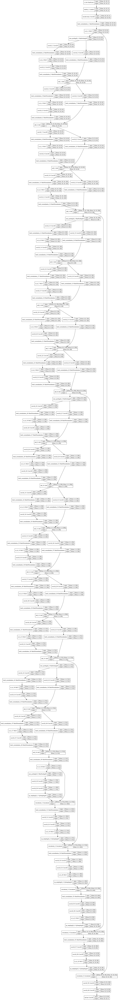

In [8]:
plot_model(unet, to_file='unet.png', show_shapes=True)

Parámetros de entrenamiento

In [0]:
epochs     = 75
batch_size = 64
alpha      = 0.0001
decay      = 0.0001
rho        = 0.9
beta_1     =0.9
beta_2     =0.999

Configuración de optimizador

In [10]:
unet.compile(optimizer = optimizers.Adam(lr=alpha, decay=decay), loss = 'mse', metrics = ['accuracy'])

Entrenamiento

In [11]:
history = unet.fit(x = X_train,
                   y = y_train,
                   batch_size = batch_size,
                   epochs = epochs,
                   validation_split = 0.2,
                   verbose = 1)



Train on 12800 samples, validate on 3200 samples
Epoch 1/75
12800/12800 [==============================] - 39s 3ms/step - loss: 0.0088 - acc: 0.6755 - val_loss: 0.0038 - val_acc: 0.7375
Epoch 2/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0033 - acc: 0.7428 - val_loss: 0.0021 - val_acc: 0.7356
Epoch 3/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0031 - acc: 0.7611 - val_loss: 0.0016 - val_acc: 0.7682
Epoch 4/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0026 - acc: 0.7692 - val_loss: 0.0014 - val_acc: 0.7898
Epoch 5/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0023 - acc: 0.7796 - val_loss: 0.0029 - val_acc: 0.7827
Epoch 6/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0021 - acc: 0.7810 - val_loss: 0.0019 - val_acc: 0.8141
Epoch 7/75
12800/12800 [==============================] - 25s 2ms/step - loss: 0.0017 - acc: 0.7918 - val_loss: 0.0011 - val_ac

In [0]:
loss  = history.history['loss']
val_loss  = history.history['val_loss']

acc  = history.history['acc']
val_acc  = history.history['val_acc']

Gráfico de accuracy en entrenamiento y validación

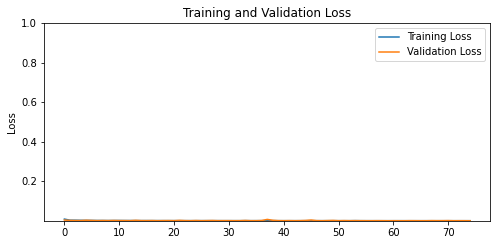

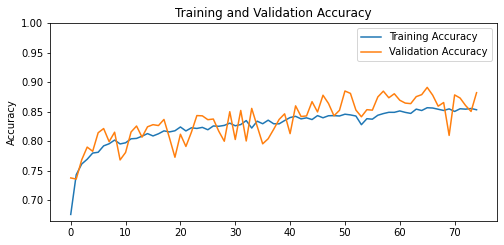

In [13]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='best')
plt.ylabel('Loss')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Loss')
plt.show()

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='best')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')
plt.show()

Muestras de la predicción en los parches de las imágenes de entrenamiento

In [0]:
y_pred = unet.predict(X_test)

Se puede observar la red neuronal hace un suavizado y mejora la resolución de la imagen a pesar de no tener aún un accuracy muy alto, llegando al rededor de un 80%.

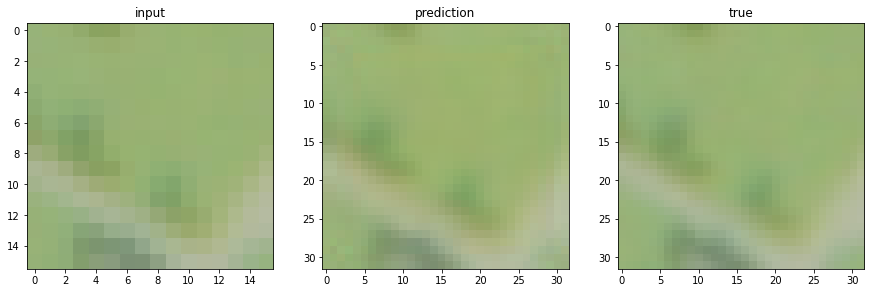

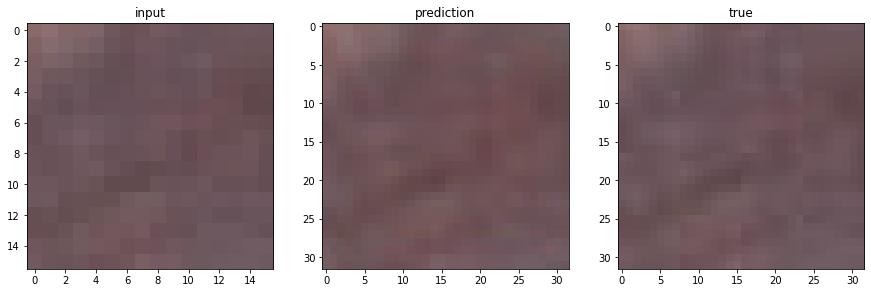

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


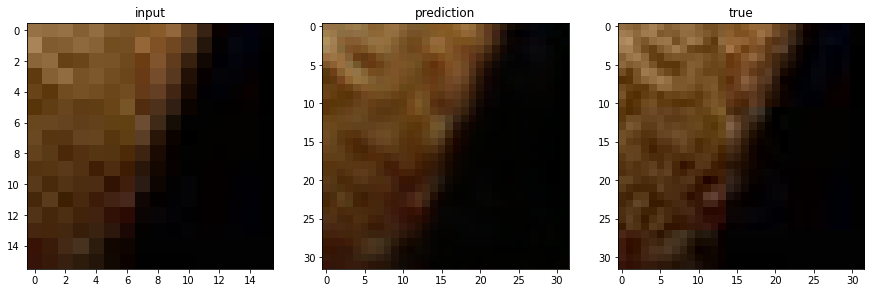

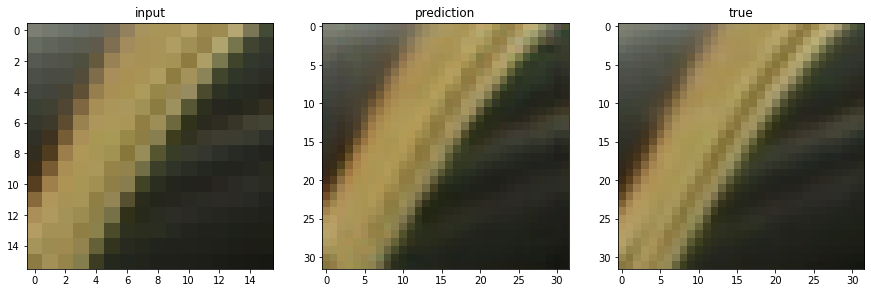

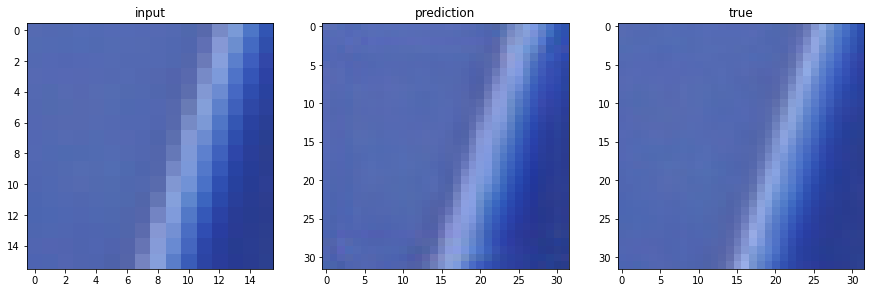

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


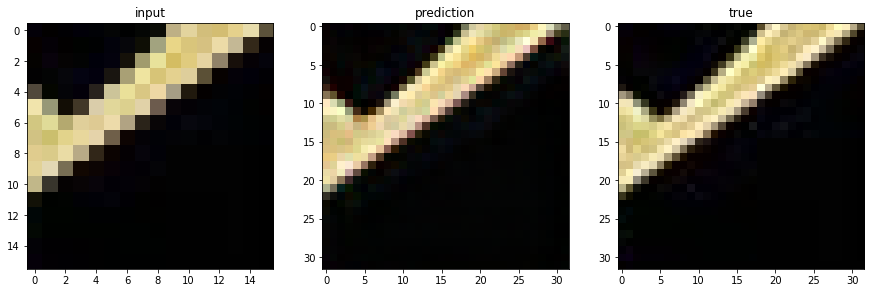

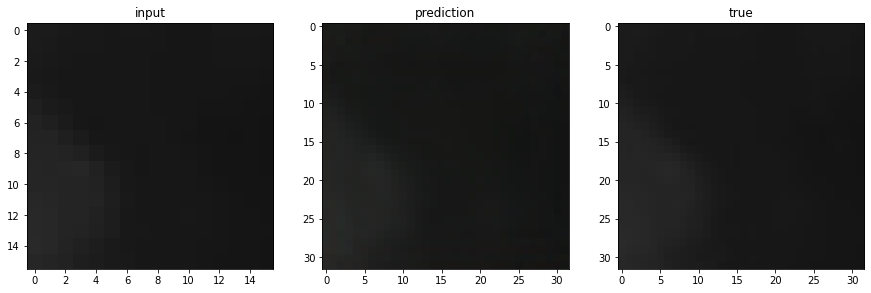

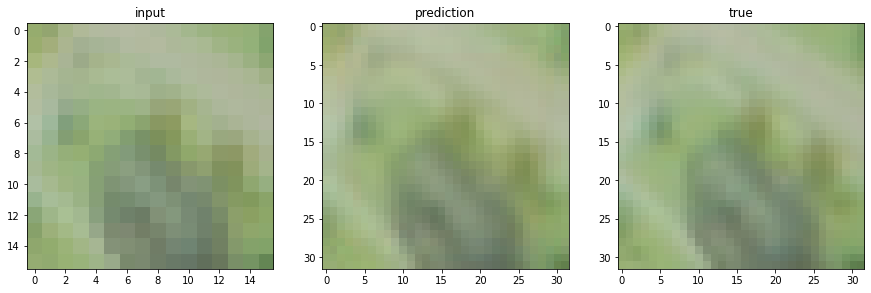

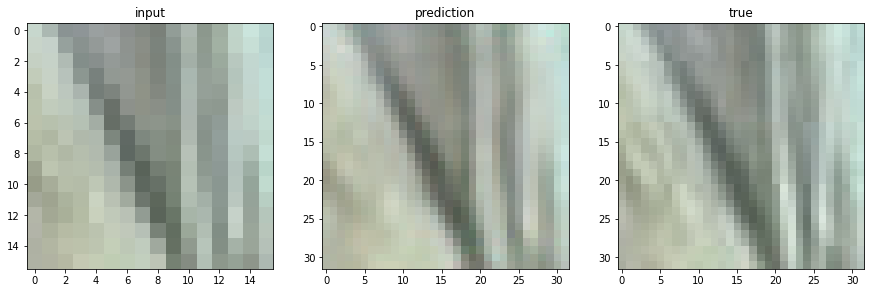

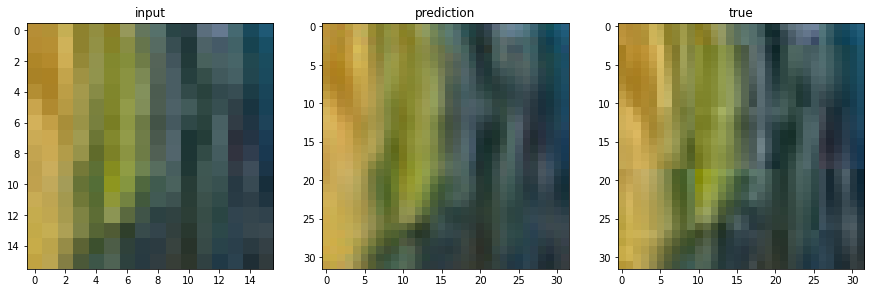

In [15]:
np.random.seed(0)
index = np.random.choice(X_test.shape[0], 10)

for j in index:
  fig, ax = plt.subplots(1, 3, figsize=(15, 15))

  imgs = [X_test[j], y_pred[j], y_test[j]]
  titles = ["input", "prediction", "true"]

  for i, axi in enumerate(ax.flat):
      img = np.random.randint(10, size=(10,10))
      axi.imshow(imgs[i])
      axi.set_title(titles[i])
  plt.show()

Se crea otro modelo donde ahora a través de un parámetro se pueden especificar las dimensiones de la imagen de entrada a la que se le quiere mejorar la resolución, para que no sólo funcione con parches de 16*16

In [0]:
def create_model(input_dim):

  filters_per_block = np.array([[64, 64, 64, 128],
                                [128, 128, 128, 256],
                                [256, 256, 256, 256, 256, 512],
                                [512, 512]])
  filters_per_block_up = np.array([512, 384, 256, 96])
  kernel_size = (3,3)

  Xdicc={}
  k = 0

  Xin  = Input(shape=((input_dim, input_dim, 3)), name="x_true")

  X = Conv2D(64, kernel_size = (7,7), padding='same', activation=None, name='encoder-entry')(Xin)
  X = BatchNormalization()(X)
  X = ReLU()(X)
  Xdicc[k] = X
  k += 1
  X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)

  # Encoder

  for i in range(len(filters_per_block)):
    for numFilters in filters_per_block[i]:
      X_t = X
      X = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X)
      X = BatchNormalization()(X)
      X = ReLU()(X)
      X = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X)
      X = BatchNormalization()(X)
      X_t = Conv2D(numFilters, kernel_size=kernel_size, padding='same', activation=None)(X_t)
      X_t = BatchNormalization()(X_t)
      X = Add()([X, X_t])
    
    if i == len(filters_per_block)-1:
      continue
    else:
      Xdicc[k] = X
      k += 1
      X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)

  # Bottleneck

  X = BatchNormalization()(X)
  X = ReLU()(X)
  Xdicc[k] = X

  X = MaxPooling2D(pool_size=(2,2), padding='valid')(X)
  X = Conv2D(1024, kernel_size=kernel_size, padding='same', activation='relu')(X)
  X = Conv2D(512, kernel_size=kernel_size, padding='same', activation='relu')(X)

  # Decoder

  Y=X
  for i in range(0, len(filters_per_block_up)):
      numFilters = filters_per_block_up[i]
      Y = UpSampling2D(size=2)(Y)
      Y = Concatenate()([Y, Xdicc[k-i]])
      Y = BatchNormalization()(Y)
      Y = Conv2D(numFilters, kernel_size=(3,3), padding='same', activation='relu')(Y)
      Y = Conv2D(numFilters, kernel_size=(3,3), padding='same', activation='relu')(Y)

  # Output layers

  Y = UpSampling2D(size=2)(Y)
  Y = Concatenate()([Y, Xdicc[0]])
  Y = Conv2D(99, kernel_size=(3,3), padding='same', activation='relu')(Y)
  Y = Conv2D(99, kernel_size=(3,3), padding='same', activation='relu')(Y)
  Y = ReLU()(Y)

  Yout = Conv2D(3, kernel_size=(1,1), padding='same', activation=None, name='tail-last')(Y)

  unetf = Model(inputs =Xin, outputs=[Yout], name = 'UnetF')

  return unetf

Se crea el nuevo modelo con un tamaño de entrada de 512*512 y se transfieren loss pesos entrenados de la red anterior

In [0]:
dim = 512
unetf = create_model(dim)
unetf.set_weights(unet.get_weights())
unetf.compile(optimizer = optimizers.adam(lr=alpha, decay=decay), loss = 'mae', metrics = ['accuracy'])

Se observan los resultados de la nueva red en 10 imágenes completas no usadas durante el entrenamiento.

In [0]:
images = []
y_true = []
  
for r, d, files in os.walk("/content/drive/My Drive/image_dataset_test"):
  for file in files:
    im = imread("/content/drive/My Drive/image_dataset_test"+"/"+file)
    if np.max(im) > 1.0:
      im = im.astype('float64')/255.
    y_true.append(cv2.resize(im, (dim,dim)))
    im = cv2.resize(im, (dim//2,dim//2))
    images.append(cv2.resize(im, (dim,dim)))

x_t = np.array(images)
y_true = np.array(y_true)
y_p = unetf.predict(x_t)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


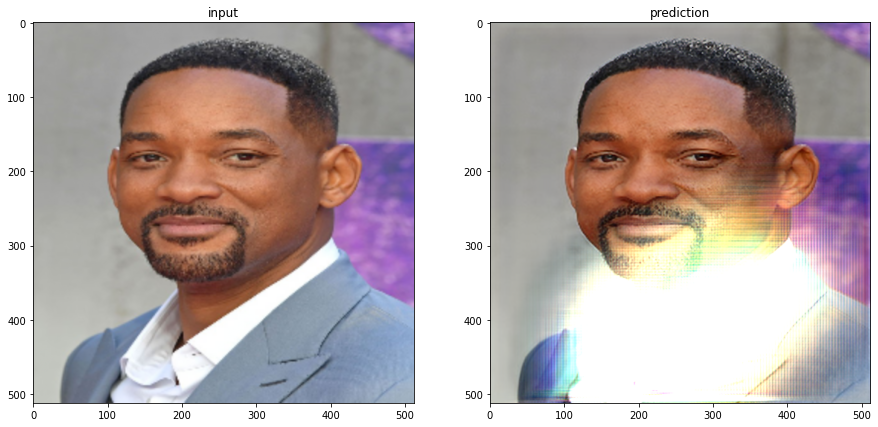

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


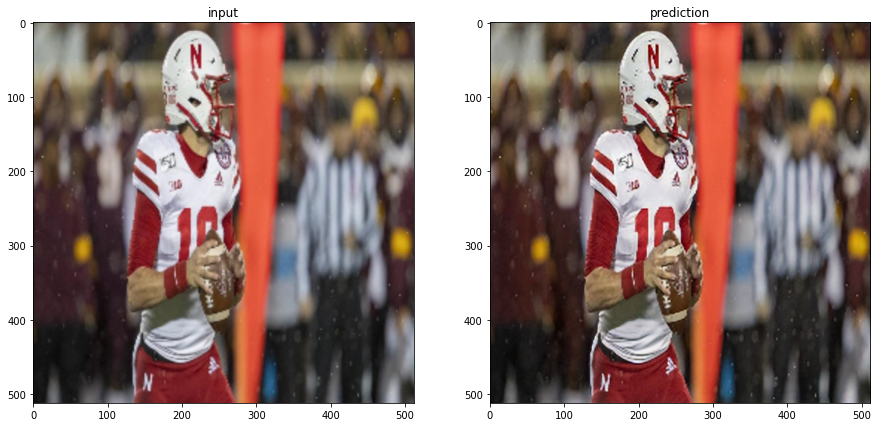

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


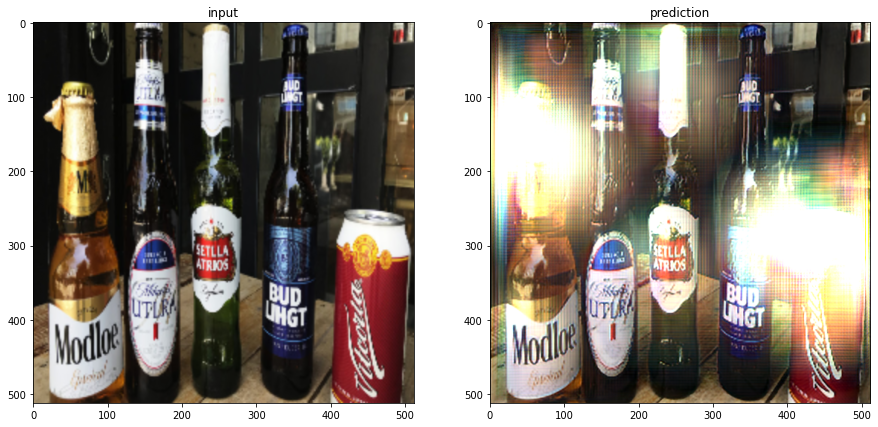

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


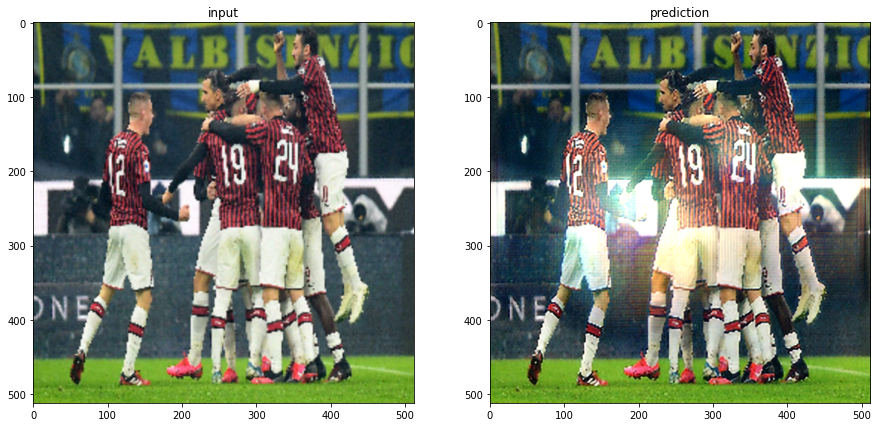

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


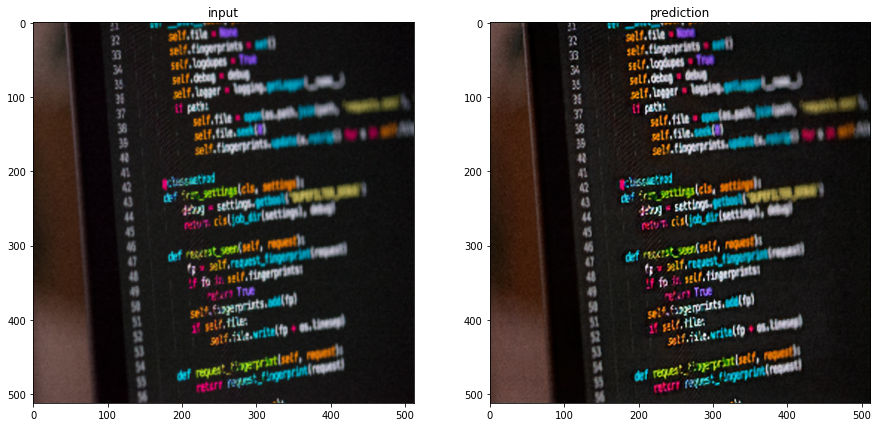

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


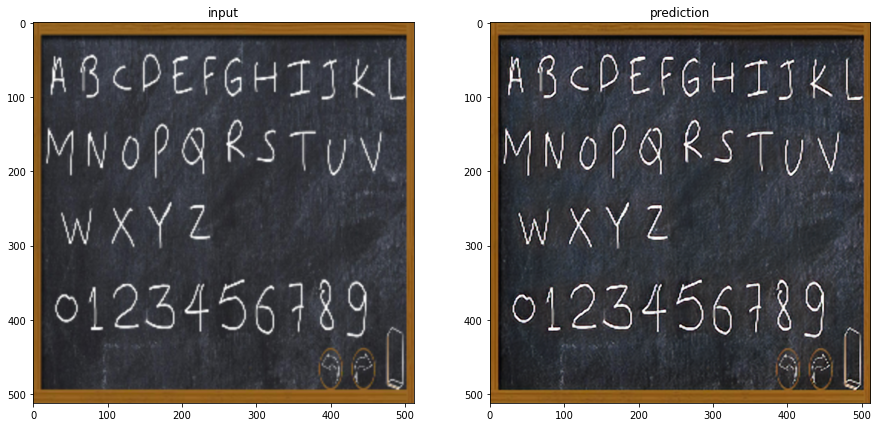

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


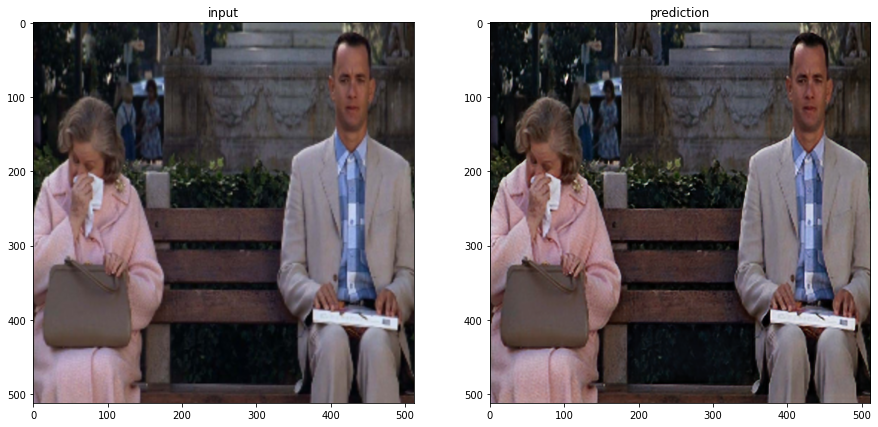

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


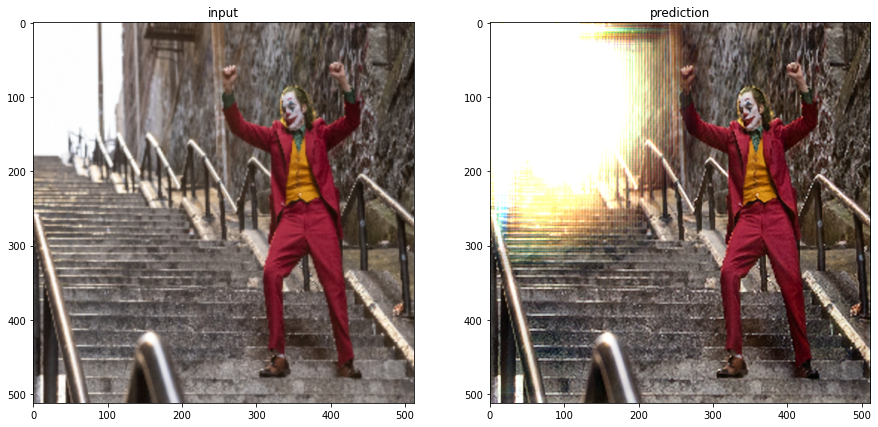

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


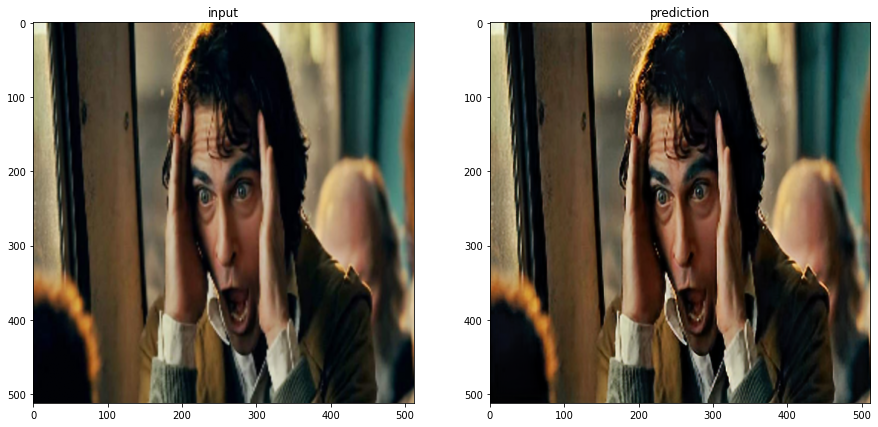

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


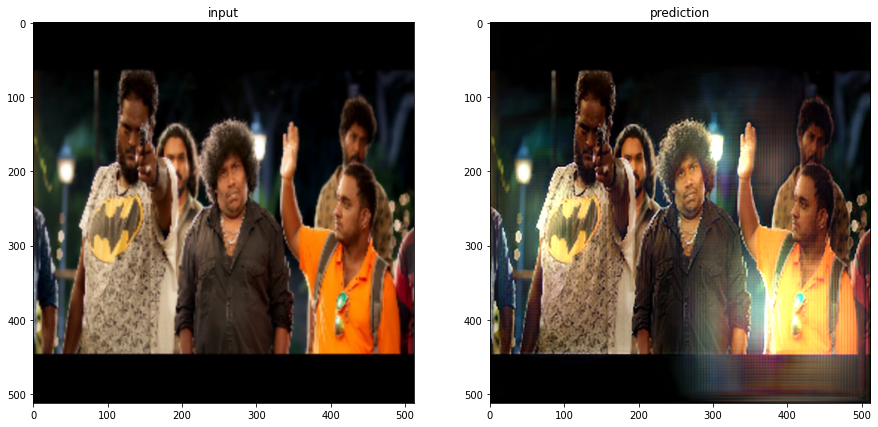

In [19]:
for k in range(x_t.shape[0]):

  fig, ax = plt.subplots(1, 2, figsize=(15, 15))

  imgs = [x_t[k], y_p[k]]
  titles = ["input", "prediction"]

  for i, axi in enumerate(ax.flat):
    axi.imshow(imgs[i])
    axi.set_title(titles[i])
  plt.show()

Se hace zoom en alguna región de las imágenes para visualizar mejor algunos detalles

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


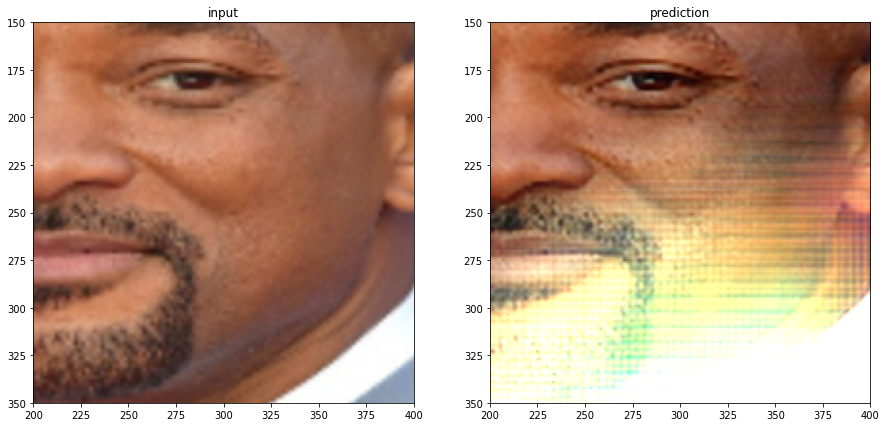

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


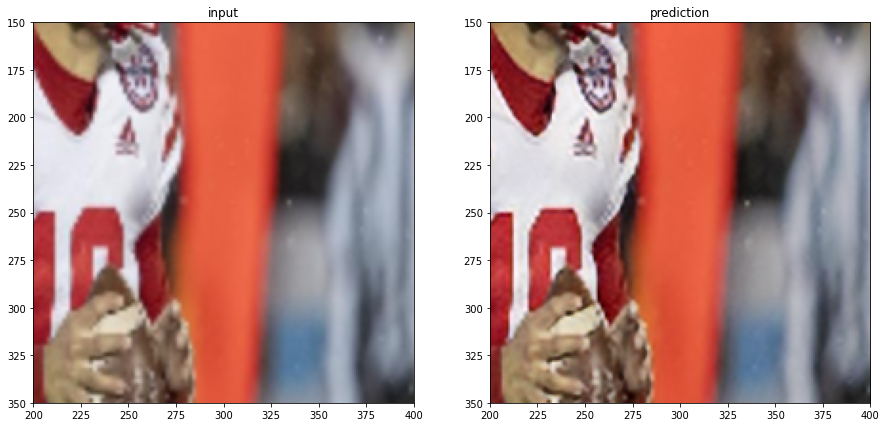

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


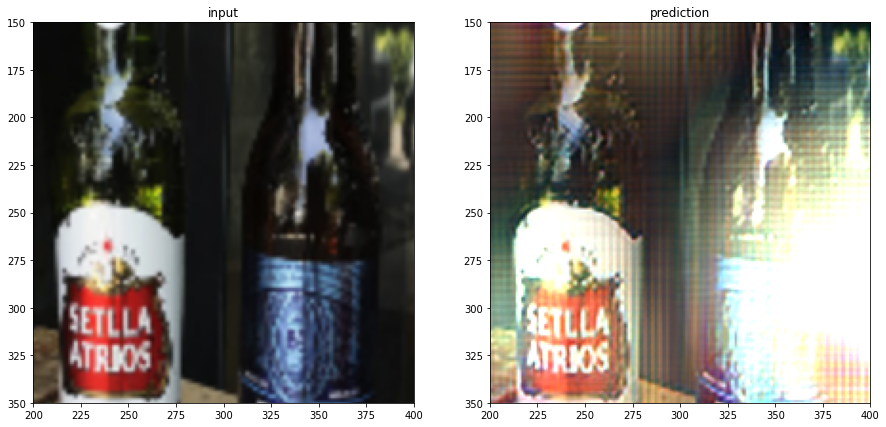

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


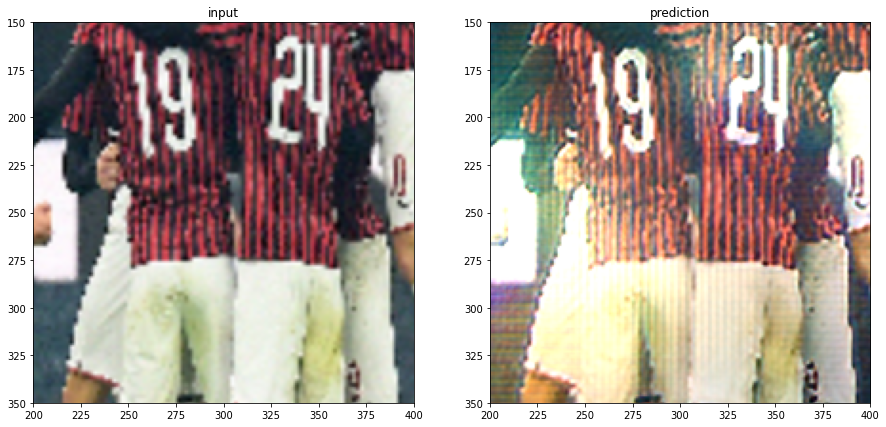

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


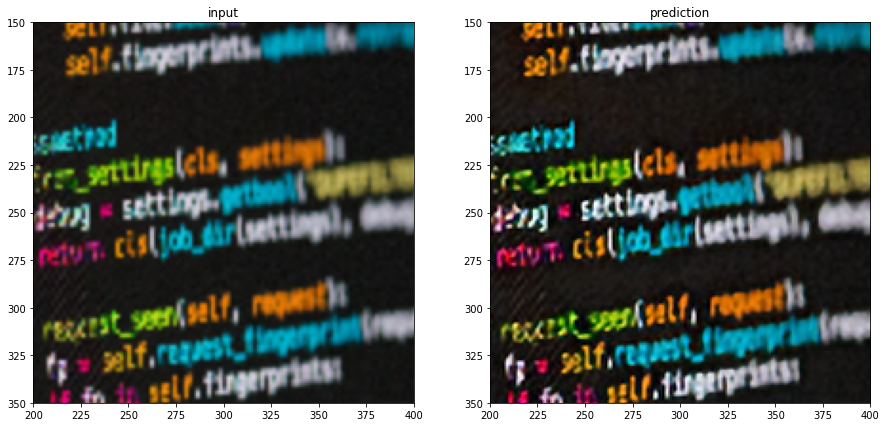

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


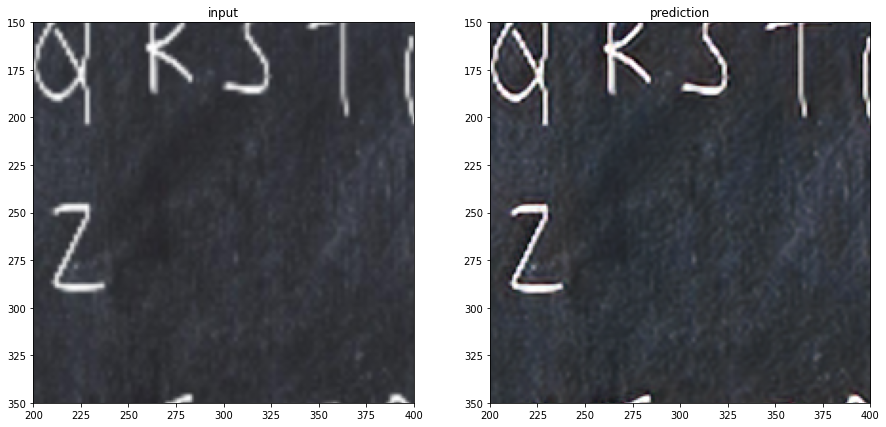

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


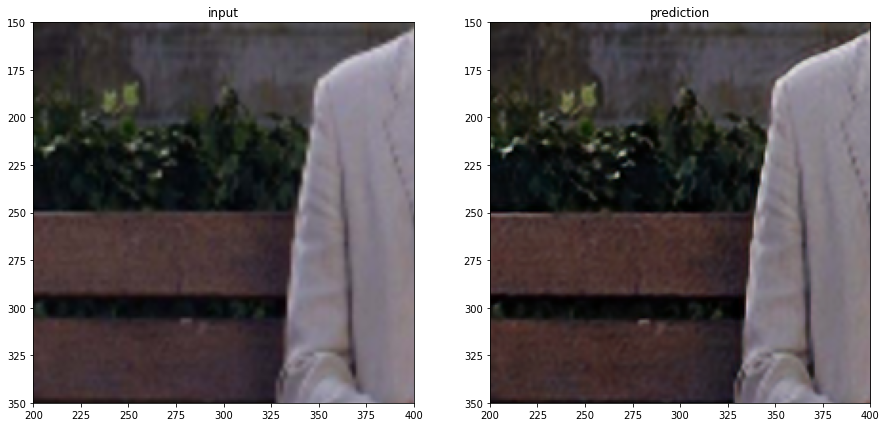

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


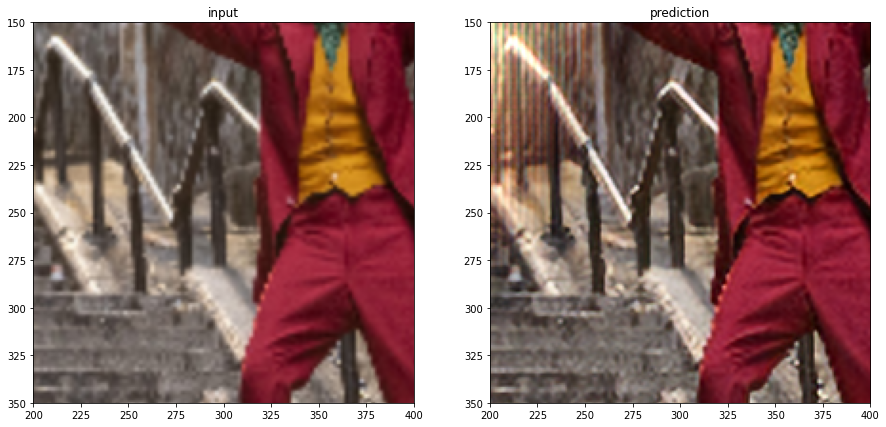

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


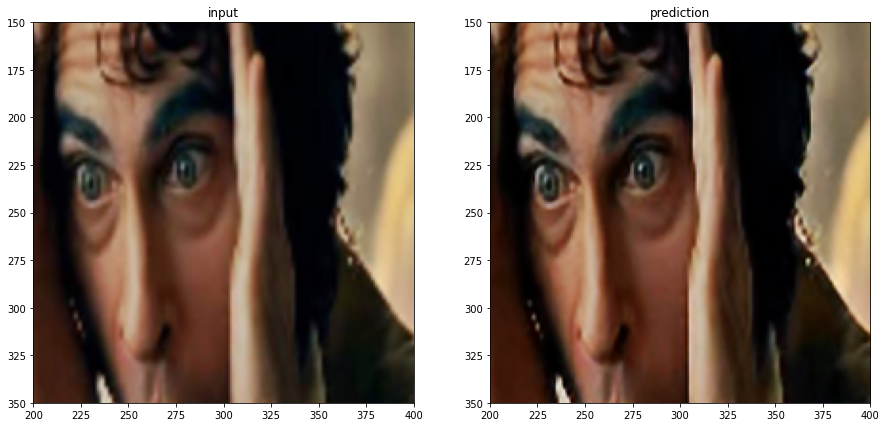

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


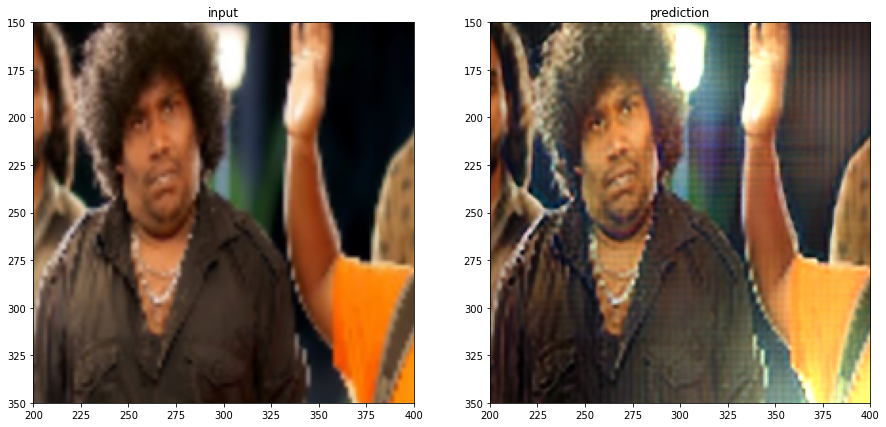

In [20]:
for k in range(x_t.shape[0]):

  fig, ax = plt.subplots(1, 2, figsize=(15, 15))

  imgs = [x_t[k], y_p[k]]
  titles = ["input", "prediction"]

  for i, axi in enumerate(ax.flat):
    axi.imshow(imgs[i])
    axi.axis([200,400,350,150])
    axi.set_title(titles[i])
  plt.show()

In [22]:
unetf.evaluate(x_t, y_true, batch_size=5)

10/10 [==============================] - 1s 79ms/step


[0.1391356773674488, 0.7839168608188629]

En el dataset de test se logra un 78% de Accuracy. Se puede observar que a pesar de que hay regiones donde se generan manchas, en las demás regiones se logra suavizar la imagen y mejorar la calidad de la imagen, siendo estos resultados comparables con los de la Unet sin la parte residual. Se podrían obtener mejores resultados haciendo una búsqueda en los hiperparámetros de la red.